LEVEL_2

TASK-1

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

In [6]:
df=pd.read_csv('Dataset .csv')

In [7]:
aggregate_ratings=df['Aggregate rating']
rating_counts=aggregate_ratings.value_counts().sort_index()

In [8]:
most_common_rating_range=rating_counts.max()
print("Most common rating range",most_common_rating_range)

Most common rating range 2148


In [9]:
average_votes=df['Votes'].mean()
print("Average number of votes received by restaurents:",average_votes)

Average number of votes received by restaurents: 156.909747670401


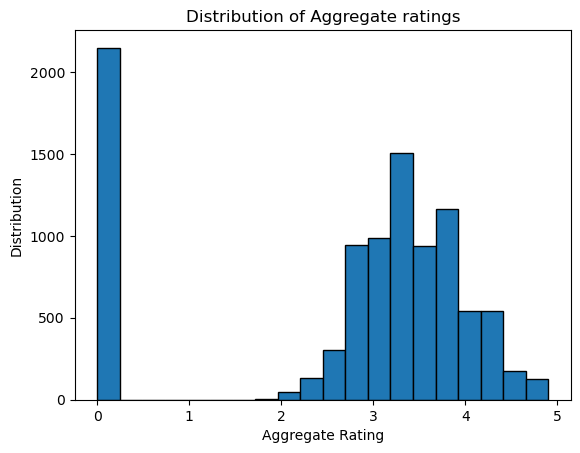

In [10]:
plt.hist(aggregate_ratings,bins=20,edgecolor='black')
plt.xlabel('Aggregate Rating')
plt.ylabel('Distribution')
plt.title('Distribution of Aggregate ratings')
plt.show()

TASK-2

In [11]:
cuisines=df['Cuisines']
aggregate_ratings=df['Aggregate rating']
cuisine_combinations_counts=cuisines.value_counts()

In [12]:
most_common_cuisine_combinations=cuisine_combinations_counts.head()
print("most_common_cuisine_combinations:",most_common_cuisine_combinations)

most_common_cuisine_combinations: Cuisines
North Indian             936
North Indian, Chinese    511
Chinese                  354
Fast Food                354
North Indian, Mughlai    334
Name: count, dtype: int64


In [13]:
cuisine_combinations_avg_rating=df.groupby('Cuisines')['Aggregate rating'].mean()
top_10_avg_ratings=cuisine_combinations_avg_rating.nlargest(10)
print('avg_ratings of top_10 cuisine_combinations:',top_10_avg_ratings)

avg_ratings of top_10 cuisine_combinations: Cuisines
American, BBQ, Sandwich         4.9
American, Burger, Grill         4.9
American, Caribbean, Seafood    4.9
American, Coffee and Tea        4.9
American, Sandwich, Tea         4.9
BBQ, Breakfast, Southern        4.9
Burger, Bar Food, Steak         4.9
Continental, Indian             4.9
European, Asian, Indian         4.9
European, Contemporary          4.9
Name: Aggregate rating, dtype: float64


Task-3 

In [14]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [15]:
import folium
from IPython.display import display
from sklearn.cluster import KMeans

In [16]:
restaurant_names=df['Restaurant Name']
latitude=df['Latitude']
longitude=df['Longitude']

x=df[['Latitude','Longitude']]
numclusters=5

kmeans=KMeans(n_clusters=numclusters,random_state=42)
df['Cluster']=kmeans.fit_predict(x)

map_center=[latitude.mean(),longitude.mean()]
restaurant_map=folium.Map(locaion=map_center,zoom_start=12)

cluster_colors=['red','blue','green','purple','orange']

E:\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [17]:
for index,row in df.iterrows():
    restaurant_names=row['Restaurant Name']
    latitude=row['Latitude']
    longitude=row['Longitude']
    cuisines=row['Cuisines']
    rating=row['Aggregate rating']
    cluster=row['Cluster']

    popup_text=f"Restaurant:{restaurant_names}\nCuisines:{cuisines}\nRating:{rating}"
    marker=folium.Marker([latitude,longitude],popup=popup_text)
    marker.add_to(restaurant_map)

In [38]:
display(restaurant_map)

TASK-4

In [19]:
restaurant_chains=df.groupby('Restaurant Name').size().reset_index(name='Chain Count')
restaurant_chains=restaurant_chains[restaurant_chains['Chain Count']>1]

In [21]:
restaurant_chains=restaurant_chains.sort_values(by='Chain Count',ascending=False)

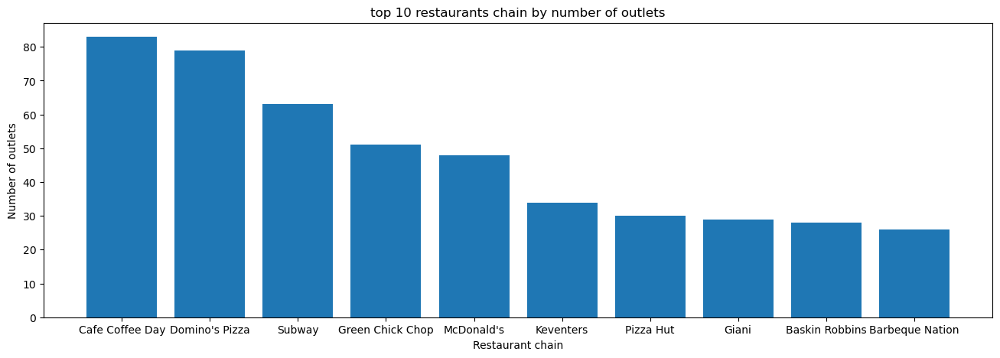

In [29]:
plt.figure(figsize=(16,5))
plt.bar(restaurant_chains['Restaurant Name'][:10],restaurant_chains['Chain Count'][:10])
plt.xlabel('Restaurant chain')
plt.ylabel('Number of outlets')
plt.title('top 10 restaurants chain by number of outlets')
plt.show()

In [30]:
chain_ratings=df.groupby('Restaurant Name')['Aggregate rating'].mean().reset_index(name='Average Rating')
chain_votes=df.groupby('Restaurant Name')['Votes'].sum().reset_index(name='Total Votes')

In [33]:
chain_analysis=pd.merge(chain_ratings,chain_votes,on='Restaurant Name')

In [ ]:
chain_analysis=chain_analysis.sort_values(by='Average Rating',ascending=False)

plt.

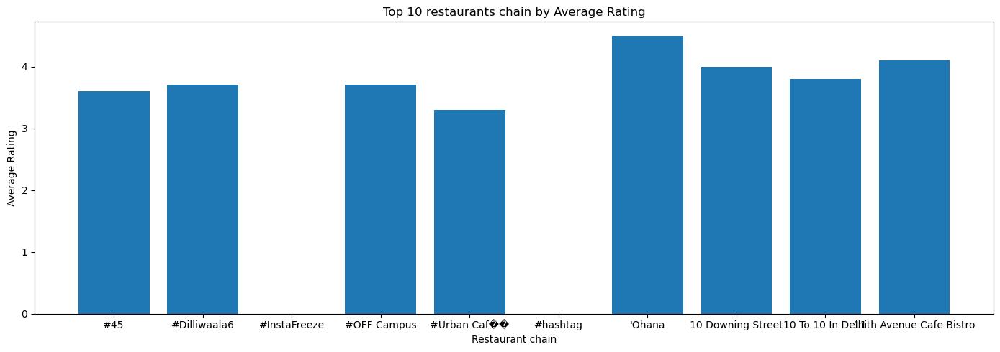

In [37]:
plt.figure(figsize=(14,5))
plt.bar(chain_analysis['Restaurant Name'][:10],chain_analysis['Average Rating'][:10])
plt.xlabel('Restaurant chain')
plt.ylabel('Average Rating')
plt.title('Top 10 restaurants chain by Average Rating')
plt.tight_layout()
plt.show()